In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.model_selection import train_test_split
import pandas as pd
import seaborn as sns
import os
import warnings

warnings.filterwarnings('ignore')
print(os.listdir("./input"))

dfg = pd.read_csv('./input/CC GENERAL.csv')
# dfg.head()

# look at describe in data viewer
# dfg.describe()

# # Let's see our data in a detailed way with pairplot
# sns.pairplot(dfg, hue='BALANCE', aspect=1, height=5)
# sns.set(rc={'figure.facecolor':'white'})
# plt.show()


# Preprocessing data
# most likely catagories for separation after viewing full pairwise matrix data
choice = ['PURCHASES', 'CREDIT_LIMIT', 'PAYMENTS', 'BALANCE', 'MINIMUM_PAYMENTS', 'CASH_ADVANCE']

# Select best data
df = pd.DataFrame(dfg[choice])

# fill nan with 0
df[['MINIMUM_PAYMENTS']] = df[['MINIMUM_PAYMENTS']].fillna(0)
df[['CREDIT_LIMIT']] = df[['CREDIT_LIMIT']].fillna(0)

df_scaled = pd.DataFrame(StandardScaler().fit_transform(df))
df_normed = pd.DataFrame(normalize(df))
df_scaled.columns = choice
df_normed.columns = choice

dfgY = dfg['CUST_ID']  # won't use this, but don't know how to leave it out at the moment
x_traindf, x_testdf, y_train, y_test = train_test_split(df_scaled, dfgY, test_size=0.1, random_state=42)
x_traindfn, x_testdfn, y_train, y_test = train_test_split(df_scaled, dfgY, test_size=0.1, random_state=42)
x_traindf.columns = choice
x_testdf.columns = choice
x_traindfn.columns = choice
x_testdfn.columns = choice
# x_test = torch.tensor(x_test)

['CC GENERAL.csv', 'Mall_Customers.csv']


In [ ]:

clusters = []

kmax = 20

for i in range(1, kmax):
    km = KMeans(n_clusters=i).fit(x_train)
    clusters.append(km.inertia_)

fig, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(x=list(range(1, kmax)), y=clusters, ax=ax)
ax.set_title('Searching for Elbow')
ax.set_xlabel('Clusters')
ax.set_ylabel('Inertia')

# Annotate arrow
ax.annotate('Possible Elbow Point', xy=(4, 87800), xytext=(4, 97800), xycoords='data',
            arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='blue', lw=2))

ax.annotate('Possible Elbow Point', xy=(10, 60000), xytext=(10, 70000), xycoords='data',
            arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='blue', lw=2))

fig.savefig('final//Kelbow.png', facecolor=fig.get_facecolor(), edgecolor='none')
plt.show()

### make explained variance plot

[0.2902219291870393, 0.48647359223927605, 0.6610998173830791, 0.8122353724114687, 0.9198104377525239, 1.0]


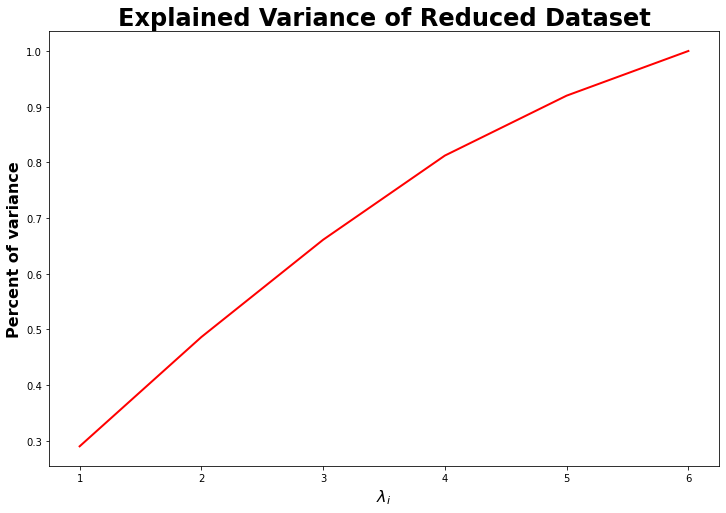

In [2]:
# do pca on training data
U, S, V = torch.pca_lowrank(torch.tensor(x_traindf.values), center=False)

# plot explained variance
EV = []
for i, s in enumerate(S):
    EV.append(s.numpy() / sum(S.numpy()))
    if i >= 1:
        EV[i] += EV[i - 1]

print(EV)

fig, ax = plt.subplots(figsize=(12, 8))
ax.plot(list(range(1, len(EV) + 1)), EV, linewidth=2, color='r')
ax.set_xlabel('$\lambda_i$', fontsize=16, fontweight='bold')
ax.set_ylabel('Percent of variance', fontsize=16, fontweight='bold')
ax.set_title('Explained Variance of Reduced Dataset', fontsize=24, fontweight='bold')
plt.show()

# PCA method

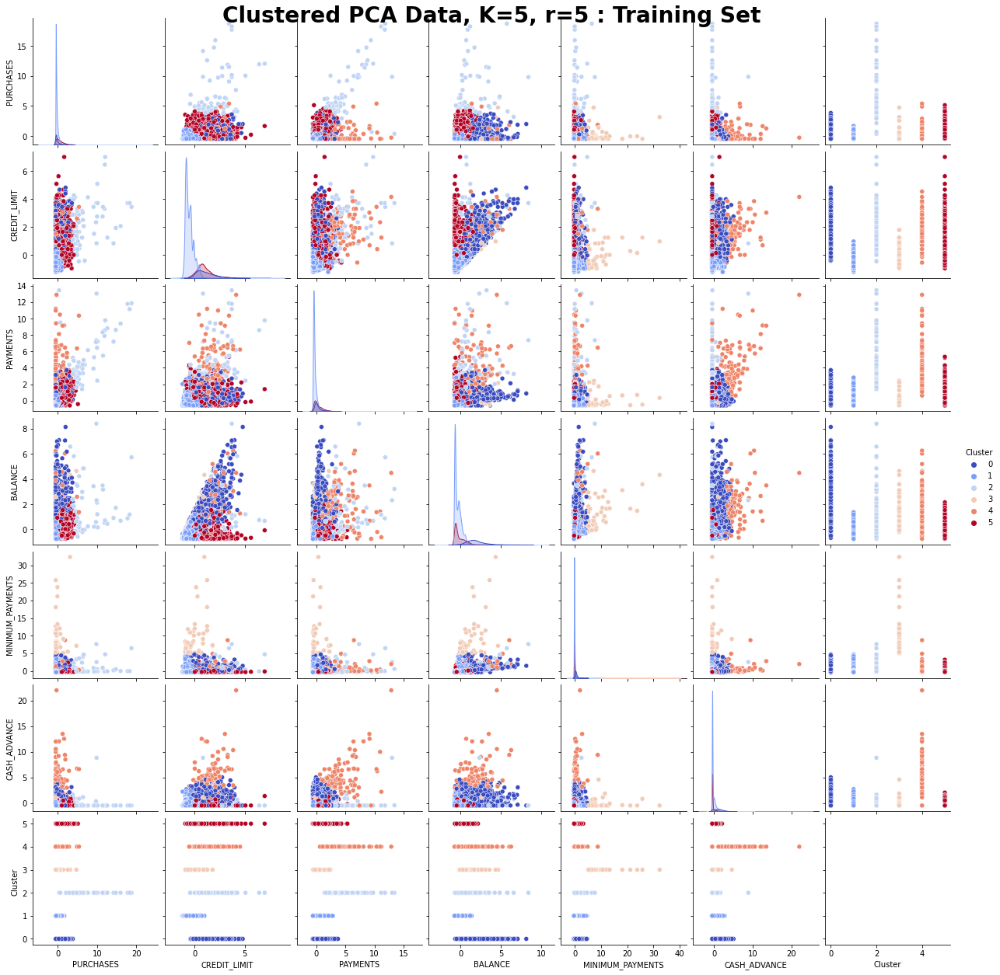

In [3]:
# do pca on training data
U, S, V = torch.pca_lowrank(torch.tensor(x_traindf.values), center=False)

rd = 5  # number of principal modes

# get projected data for model
x_train_proj = torch.tensor(x_traindf.values) @ V[:, :rd]

# Do Kmeans clustering algorithm
K = 6  # number of clusters
model = KMeans(n_clusters=K)
label = model.fit_predict(x_train_proj)

# create a 'cluster' column
# df_scaled['cluster'] = label
x_traindf.insert(6, 'Cluster', label, True)
choice.append('Cluster')

# make a Seaborn pairplot
g = sns.pairplot(x_traindf, hue='Cluster', palette='coolwarm', vars=choice)
g.fig.suptitle('Clustered PCA Data, K=5, r=5 : Training Set', fontsize=28, fontweight='bold', y=0.999)
g.fig.savefig('PCApredictTrain1.png', facecolor=fig.get_facecolor(), edgecolor='none')
plt.show()

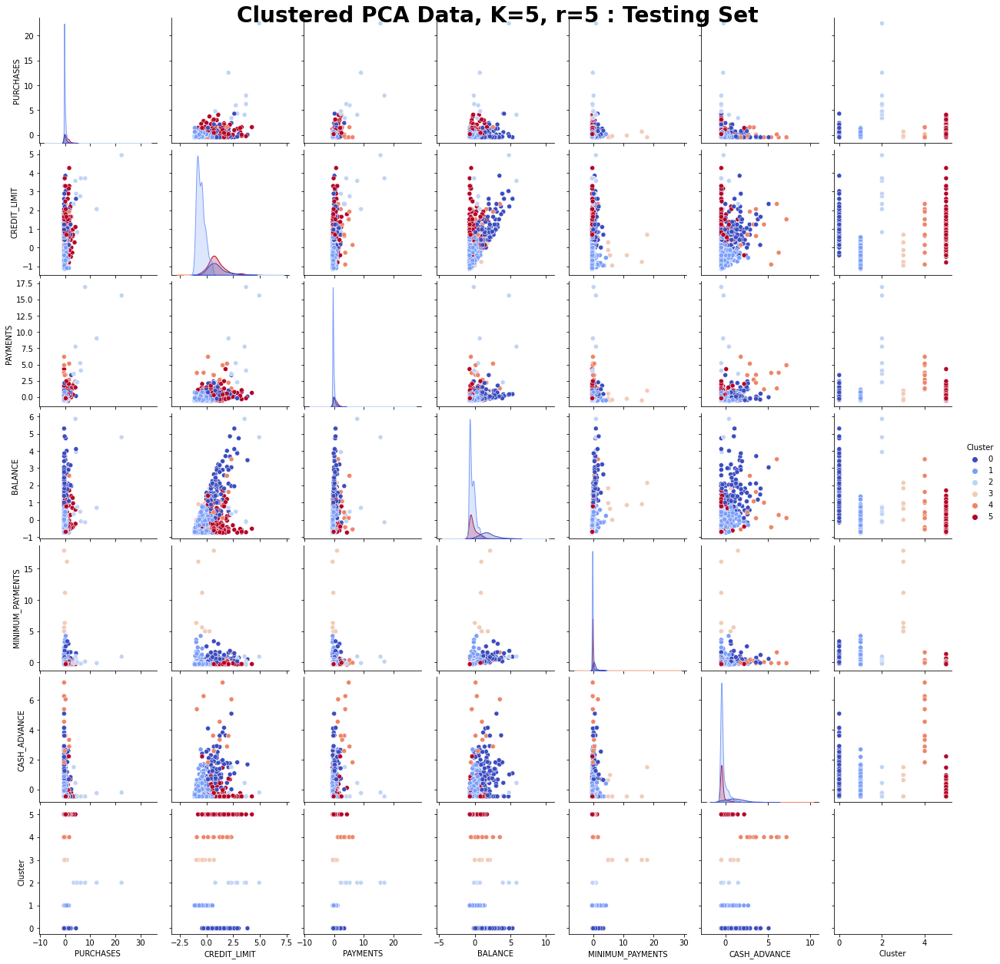

In [4]:
# get projected data for test model
x_test_proj = torch.tensor(x_testdf.values) @ V[:, :rd]

# Do Kmeans clustering algorithm
testlabel = model.predict(x_test_proj)

x_testdf.insert(6, 'Cluster', testlabel, True)

# make a Seaborn pairplot
# fig, ax = plt.subplots()
g = sns.pairplot(x_testdf, hue='Cluster', palette='coolwarm', vars=choice)
g.fig.suptitle('Clustered PCA Data, K=5, r=5 : Testing Set', fontsize=28, fontweight='bold', y=0.999)
g.fig.savefig('PCApredictTest1.png', facecolor=fig.get_facecolor(), edgecolor='none')
plt.show()

# SVD method

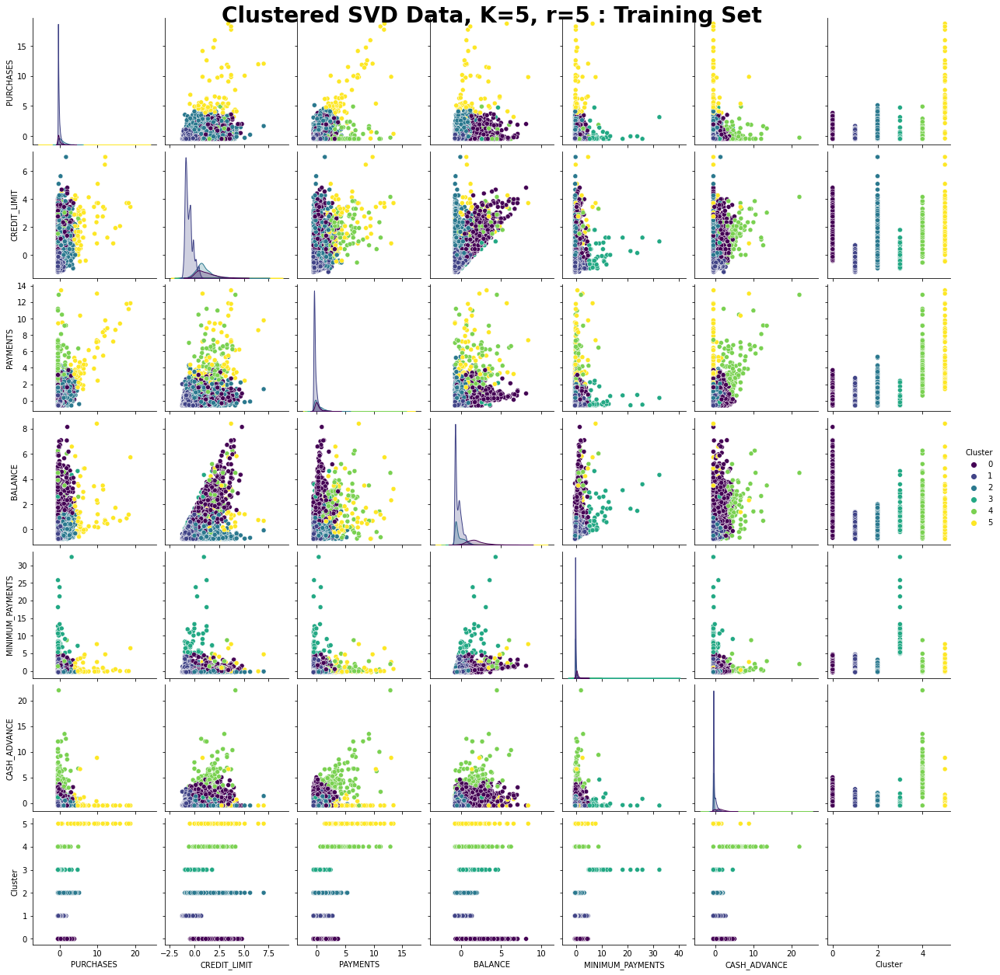

RuntimeError: mat1 and mat2 shapes cannot be multiplied (895x6 and 7x5)

In [9]:
choice = ['PURCHASES', 'CREDIT_LIMIT', 'PAYMENTS', 'BALANCE', 'MINIMUM_PAYMENTS', 'CASH_ADVANCE']

# do svd on training data
U, S, Vh = torch.linalg.svd(torch.tensor(x_traindfn.values))
V = Vh.T

rd = 5  # number of singular vectors

# get projected data for model
x_trainn_proj = torch.tensor(x_traindfn.values) @ V[:, :rd]

# Do Kmeans clustering algorithm
K = 6  # number of clusters
model = KMeans(n_clusters=K)
label = model.fit_predict(x_trainn_proj)


# create a 'cluster' column
x_traindfn = x_traindfn.drop(['Cluster'], axis=1)
x_traindfn.insert(6, 'Cluster', label, True)
choice.append('Cluster')

# #%%
# make a Seaborn pairplot
g = sns.pairplot(x_traindfn, hue='Cluster', palette='viridis', vars=choice)
g.fig.suptitle('Clustered SVD Data, K=5, r=5 : Training Set', fontsize=28, fontweight='bold', y=0.999)
g.fig.savefig('SVDpredictTrain1.png', facecolor=fig.get_facecolor(), edgecolor='none')
plt.show()

# get projected data for test model
x_testn_proj = torch.tensor(x_testdfn.values) @ V[:, :rd]

# Do Kmeans clustering algorithm
testlabel = model.predict(x_testn_proj)

x_testdfn = x_testdfn.drop(['Cluster'], axis=1)
x_testdfn.insert(6, 'Cluster', testlabel, True)

# make a Seaborn pairplot
# fig, ax = plt.subplots()
g = sns.pairplot(x_testdfn, hue='Cluster', palette='viridis', vars=choice)
g.fig.suptitle('Clustered SVD Data, K=5, r=5 : Testing Set', fontsize=28, fontweight='bold', y=0.999)
g.fig.savefig('SVDpredictTest1.png', facecolor=fig.get_facecolor(), edgecolor='none')
plt.show()


# Assignment: Clustering and Classification of Credit Card Users

In [5]:
import pandas as pd
df = pd.read_csv("./input/CC GENERAL.csv")
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


When processing data with many different scales, you should normalize each dimension so that it has mean 0 and Variance 1.

## Your task
1. Normalize each dimension of the data and split into train set (8000) and test set (1000)
2. Use k-means clustering to separate the customers into k groups
3. Find the "elbow" of the intertia vs. k plot to find the best value of k
4. Can you define what each of the clusters represents?
5. Take the PCA and SVD Decompositions of your training data and take the r-dimensional (choose r <=5) projection in these spaces.
6. Transform the coordinates of your k centroids to the new space defined by the PCA and SVD.
7. For the test set, classify each data point by the nearest centroid in a) the original (full) coordinates, b) the PCA coordinates, c) the SVD coordinates
8. Use the original (full) coordinates as "truth", generate a confusion matrix for each of the other spaces. Which classes were most and least affected by coordinate transforms?

## Load data and look at statistical description of data

In [7]:
import pandas as pd

dfg = pd.read_csv('./input/CC GENERAL.csv')
dfg.describe()
# easier to view in PyCharm data viewer

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


### Preprocessing the data
See if there is missing data in the form of NaN values

In [53]:
dfg.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

They are 2 catagories that have NaN valued data:
* Credit limit (1 value)
* Minimum payments (313 values)

I found some suggestions for ways to deal with NaNs here (https://medium
.com/@andykashyap/5-simple-ways-to-deal-with-nan-in-your-data-c064289b6112). We could
* Drop the column
    * Seems excessive for such a small number of NaNs
* Drop the rows
    * This could work, but there might be a better option
* Skip the data somehow
    * Seems cumbersome to code
* Fill the missing value with a rational choice
    * Fill NaN value with previous entry
        * This doesn't really fit the situation here, where each row is an independent person
    * Fill NaN value with feature mean
        * Doesn't make sense for same reason as above
    * Fill with some rational choice, like min or max value.
        * This makes the most sense given the categories

For the missing values in the  MINIMUM_PAYMENT category, setting those to 0 makes good sense.

In [8]:
# fill nan with 0
dfg[['MINIMUM_PAYMENTS']] = dfg[['MINIMUM_PAYMENTS']].fillna(0)
# fill nan with 0
dfg[['CREDIT_LIMIT']] = dfg[['CREDIT_LIMIT']].fillna(0)
# fill nan with median column value
# dfg[['MINIMUM_PAYMENTS']] = dfg[['MINIMUM_PAYMENTS']].fillna(dfg[['MINIMUM_PAYMENTS']].median())
# fill nan with mean column value
# dfg[['MINIMUM_PAYMENTS']] = dfg[['MINIMUM_PAYMENTS']].fillna(dfg[['MINIMUM_PAYMENTS']].mean())

dfgY = dfg['CUST_ID']
dfg  = dfg.drop('CUST_ID', axis=1)
cols = list(dfg.columns)
dfg  = pd.DataFrame(dfg, columns=cols)

In [408]:
(dfg[['MINIMUM_PAYMENTS']].median(), dfg[['MINIMUM_PAYMENTS']].mean())

(MINIMUM_PAYMENTS    312.343947
 dtype: float64,
 MINIMUM_PAYMENTS    864.206542
 dtype: float64)

For the single missing CREDIT_LIMIT value, let's view the row (customer data)

In [55]:
dfg[dfg['CREDIT_LIMIT'].isna()]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,C15349,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


This customer has only ever had one cash advance and has made no purchases of any kind. This leads me to think that assuming that the credit limit is resonable, so that will be the way we deal with this.

In [465]:
# fill nan with 0
dfg[['CREDIT_LIMIT']] = dfg[['CREDIT_LIMIT']].fillna(0)
# fill nan with median column value
# dfg[['CREDIT_LIMIT']] = dfg[['CREDIT_LIMIT']].fillna(dfg[['CREDIT_LIMIT']].median())
# fill nan with mean column value
# dfg[['CREDIT_LIMIT']] = dfg[['CREDIT_LIMIT']].fillna(dfg[['CREDIT_LIMIT']].mean())

Check if that worked.

In [411]:
dfg.isna().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

It worked! One last thing, all of the columns have either or floating point values or integers except for the first
one, which is thecustomer ID. This won't work well with the rest of the data. so let's drop that row.

In [466]:
dfgY = dfg['CUST_ID']
dfg  = dfg.drop('CUST_ID', axis=1)
cols = list(dfg.columns)
dfg  = pd.DataFrame(dfg, columns=cols)

### Now we standardize and normalize the data

In [9]:
from sklearn.preprocessing import StandardScaler, normalize

scaler = StandardScaler()
dfg_scaled = scaler.fit_transform(dfg)
# dfg_scaled = pd.DataFrame(dfg_scaled, columns=cols)

dfg_normed = normalize(dfg)  # doesn't mean=center. Thought that SVD would work better with this, but no
# dfg_normed = pd.DataFrame(dfg_normed, columns=cols)

## Now choose pairs of features to view

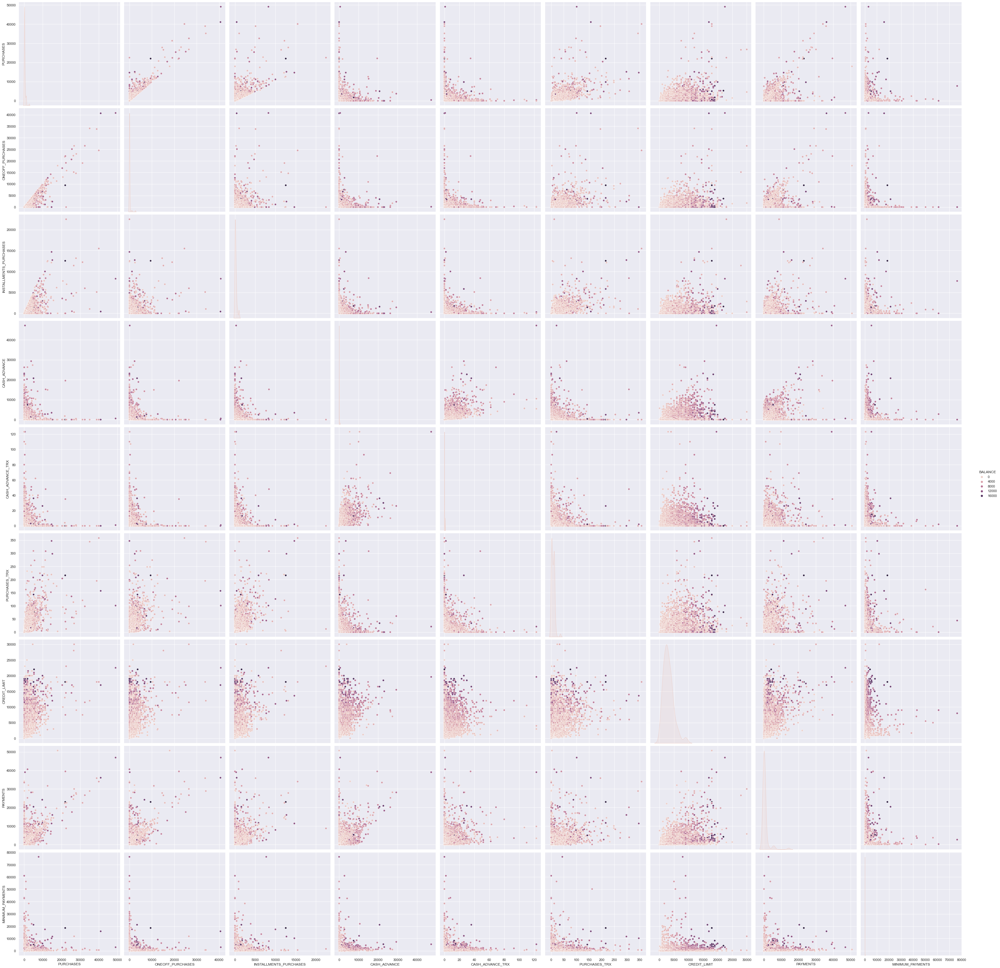

In [98]:
import seaborn as sns

# Let's see our data in a detailed way with pairplot
# X = dfg_scaled  #df.drop(['CustomerID', 'Gender'], axis=1)
sns.pairplot(dfg[['BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS']], hue='BALANCE', aspect=1, height=5)
sns.set(rc={'figure.facecolor':'white'})
plt.show()

### View heatmap

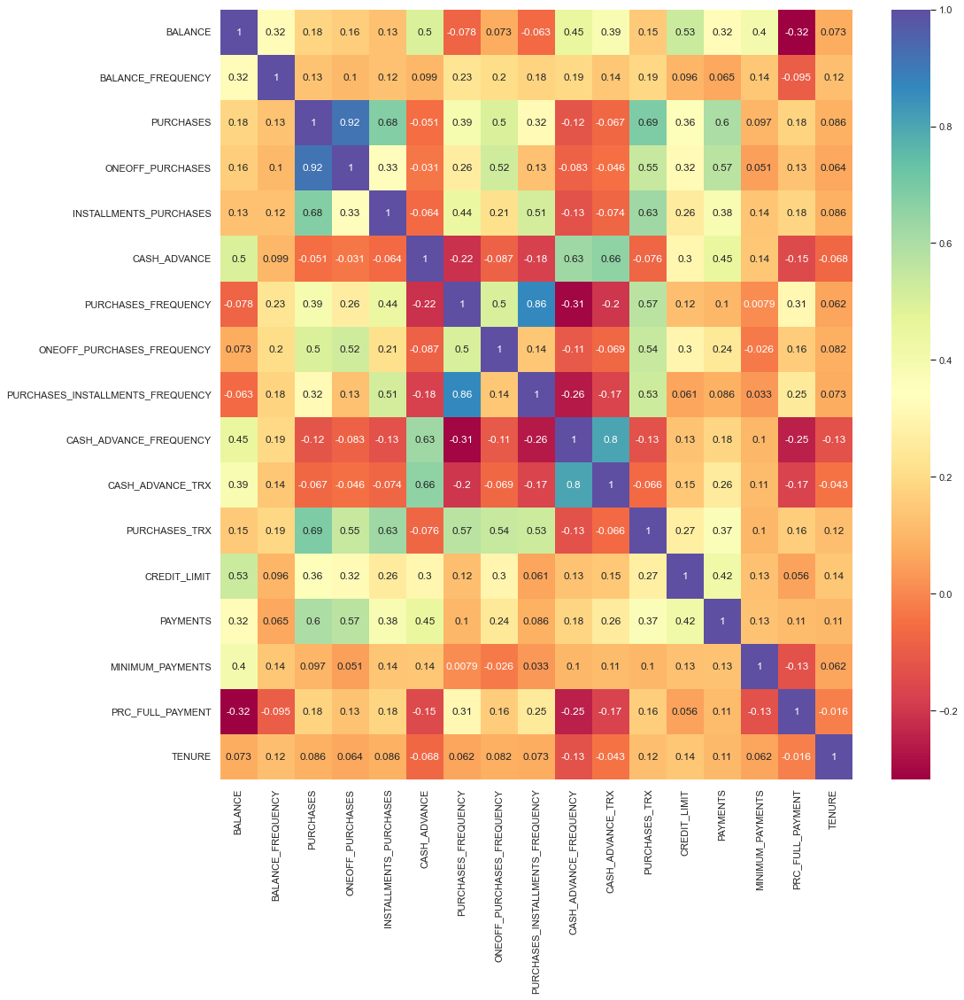

In [139]:


plt.figure(figsize = (16, 16))
sns.heatmap(dfg.corr(), annot=True, cmap=sns.color_palette('Spectral', as_cmap=True),
            xticklabels=dfg.columns,
            yticklabels=dfg.columns)

plt.show()

## Split into training and test sets
Use scaled data (mean centered) for PCA

In [11]:
import torch
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(dfg_scaled, dfgY, test_size=0.1, random_state=42)
x_test = torch.tensor(x_test)

[0.1485981986928256, 0.27840839612431256, 0.36218309007906385, 0.44056658709334084, 0.5117480111758026, 0.5800703917410999, 0.6434170933749932, 0.7028402814950372, 0.7582820716681293, 0.8086459907649689, 0.8527306128786267, 0.8906913703056999, 0.9245799419352021, 0.9559838544055653, 0.985091202611097, 0.9998109927611424, 0.9999999999999998]


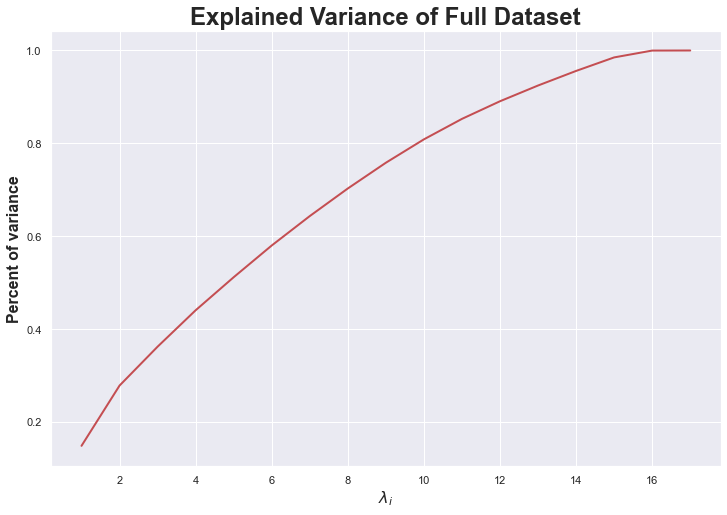

In [483]:
# do pca on training data
U, S, V = torch.pca_lowrank(torch.tensor(x_train), center=False, q=17)

# plot explained variance
EV = []
for i, s in enumerate(S):
    EV.append(s.numpy()/sum(S.numpy()))
    if i>=1:
        EV[i] += EV[i-1]

print(EV)

fig, ax = plt.subplots(figsize=(12, 8))
ax.plot(list(range(1, len(EV)+1)), EV, linewidth=2, color='r')
ax.set_xlabel('$\lambda_i$', fontsize=16, fontweight='bold')
ax.set_ylabel('Percent of variance', fontsize=16, fontweight='bold')
ax.set_title('Explained Variance of Full Dataset', fontsize=24, fontweight='bold')
plt.show()


In [482]:
U, S, V = torch.pca_lowrank(torch.tensor(x_train), center=False, q=17)
S.shape
# x_train.shape

torch.Size([17])

In [473]:
len(EV)

6

## K-means on raw data

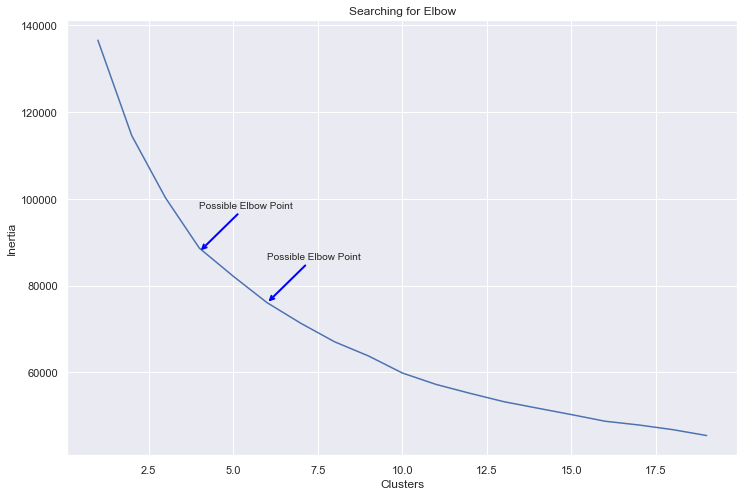

In [462]:
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.cluster import KMeans
import seaborn as sns

clusters = []

kmax = 20

for i in range(1, kmax):
    km = KMeans(n_clusters=i).fit(x_train)
    clusters.append(km.inertia_)

fig, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(x=list(range(1, kmax)), y=clusters, ax=ax)
ax.set_title('Searching for Elbow')
ax.set_xlabel('Clusters')
ax.set_ylabel('Inertia')

# Annotate arrow
ax.annotate('Possible Elbow Point', xy=(4, 87800), xytext=(4, 97800), xycoords='data',
             arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='blue', lw=2))

ax.annotate('Possible Elbow Point', xy=(6, 76000), xytext=(6, 86000), xycoords='data',
             arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='blue', lw=2))

fig.savefig('Kelbow_nanmean.png', facecolor=fig.get_facecolor(), edgecolor='none')
plt.show()


## Now do PCA

In [31]:
# import torch
# import matplotlib.pyplot as plt
# %matplotlib inline
# from sklearn.cluster import KMeans
# import seaborn as sns
# import numpy as np
# from sklearn.metrics import confusion_matrix
# # x = torch.tensor(x_train.values)


### K-means on PCA of data

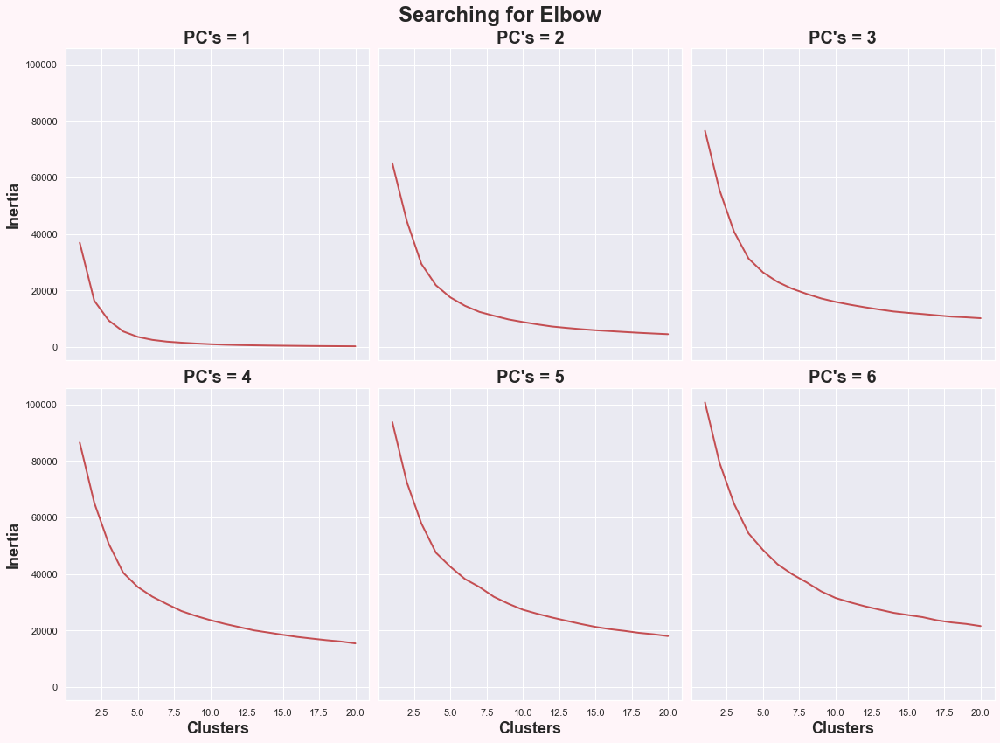

In [438]:

#Calculate PCA
U, S, V = torch.pca_lowrank(torch.tensor(x_train), center=False)

#Low-dimensional Reconstruction

r = np.arange(1, 7) #Number of (reduced) dimensions to use
if len(r) % 2 != 0:  #isinstance(len(r)/2, float):
    print('Odd number of points in r.')

fig, ax = plt.subplots(2, int((r[-1]+1)/2), figsize=(16, 12), sharex=True, sharey=True)

for j, rd in enumerate(r):
    X_red = U[:, :rd]@(torch.diag(S)[:rd, :rd])@V.T[:rd, :]

    clusters = []

    kmax = 21

    for i in range(1, kmax):
        km = KMeans(n_clusters=i).fit(X_red)
        clusters.append(km.inertia_)

    if j < (len(r)/2):
        i = 0
    else:
        i = 1
        j = int(j - len(r)/2)

    # print('i, j', i, j)
    sns.lineplot(x=list(range(1, kmax)), y=clusters, ax=ax[i, j], linewidth=2, color='r')
    ax[i, j].set_title(f'PC\'s = {rd}', fontsize=20, fontweight='bold')
    if j == 0:
        ax[i, j].set_ylabel('Inertia', fontsize=18, fontweight='bold')
    if i == 1:
        ax[i, j].set_xlabel('Clusters', fontsize=18, fontweight='bold')

    # # Annotate arrow
    # ax[j].annotate('Possible Elbow Point', xy=(4, 87800), xytext=(4, 97800), xycoords='data',
    #              arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='blue', lw=2))
    #
    # ax[j].annotate('Possible Elbow Point', xy=(10, 60000), xytext=(10, 70000), xycoords='data',
    #              arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='blue', lw=2))

fig.suptitle('Searching for Elbow', fontsize=24, fontweight='bold')
fig.patch.set_facecolor('#FFF5F9')
# fig.patch.set_alpha(0)
fig.tight_layout()
fig.savefig('PCA_nanmean//PCAelbow.png', facecolor=fig.get_facecolor(), edgecolor='none')
plt.show()


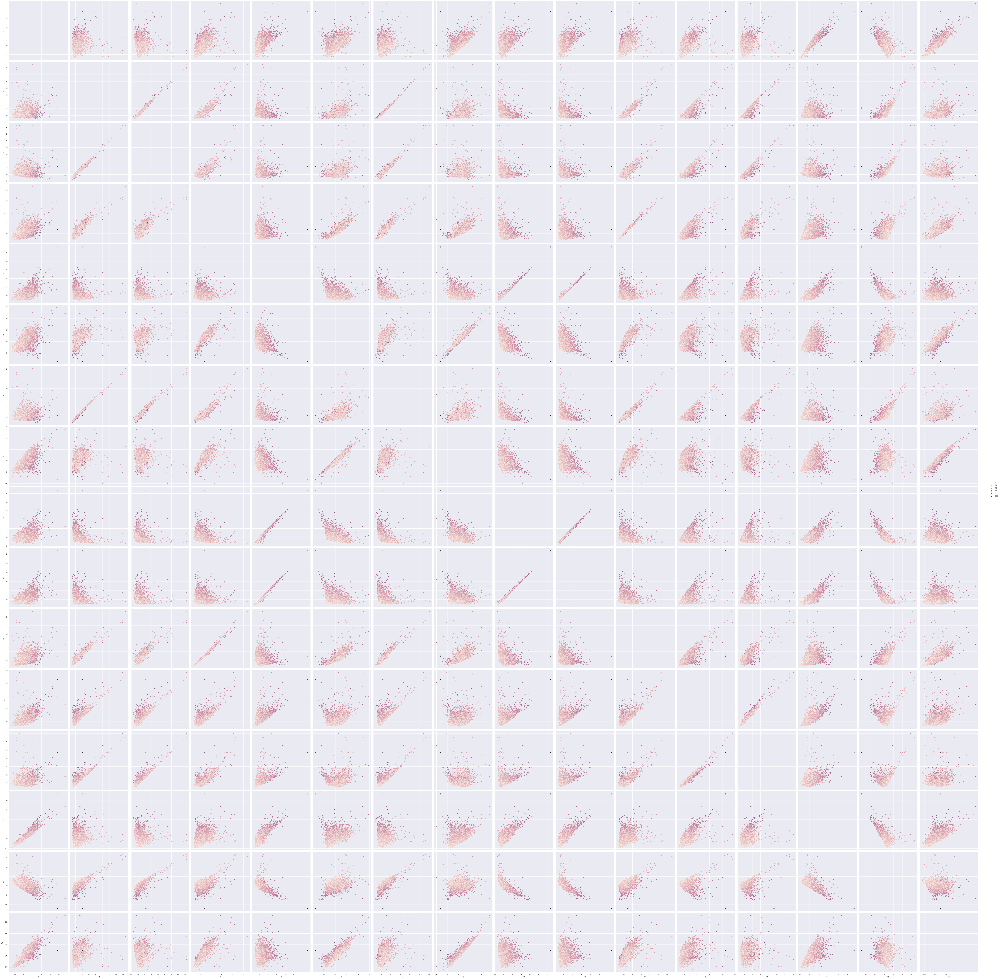

In [94]:
# import seaborn as sns
# rd = 3
# X_red = U[:, :rd]@(torch.diag(S)[:rd, :rd])@V.T[:rd, :]
# Xdf = pd.DataFrame(X_red.numpy())
# # Let's see our data in a detailed way with pairplot
# hue = 1
# fig = sns.pairplot(Xdf, hue=hue, aspect=1, height=5)
# sns.set(rc={'figure.facecolor':'white'})
# fig.savefig(f'pwPCA{rd}_{hue}.png', facecolor=fig.get_facecolor(), edgecolor='none')
# plt.show()

## Implement clustering using chosen number of principal components and clusters

In [439]:
#Calculate PCA
U, S, V = torch.pca_lowrank(torch.tensor(x_train), center=False)

# K means clustering
# x = torch.rand(50, 2)
for rd in range(2, 6):
    for K in range(2, 11):
        # rd = 5
        X_red = U[:, :rd] @ (torch.diag(S)[:rd, :rd]) @ V.T[:rd, :]
        x = X_red.clone().detach()
        # K = 4 #Define K ahead of time
        Niter = 12 # Defne number of mean update iterations
        N, D = x.shape  # Number of samples, dimension of the ambient space

        c = x[:K, :].clone()  # Simplistic initialization for the centroids

        x_i = x.view(N, 1, D)  #torch.Tensor(x.view(N, 1, D))  # (N, 1, D) samples
        c_j = c.view(1, K, D)  #torch.Tensor(c.view(1, K, D))  # (1, K, D) centroids

        nrow = 4
        ncol = int(Niter/4)

        fig, axe = plt.subplots(nrows=nrow, ncols=ncol, figsize = (26, 18))

        for i, ax in enumerate(fig.axes):
            if i == (Niter - 1):
                handles, labels = ax.get_legend_handles_labels()
                fig.legend(handles, labels, loc='lower center', ncol=K)

            # E step: assign points to the closest cluster -------------------------
            D_ij = ((x_i - c_j) ** 2).sum(-1)  # (N, K) symbolic squared distances
            cl = D_ij.argmin(dim=1).long().view(-1)  # Points -> Nearest cluster

            # M step: update the centroids to the normalized cluster average: ------
            # Compute the sum of points per cluster:
            c.zero_()
            c.scatter_add_(0, cl[:, None].repeat(1, D), x)

            # Divide by the number of points per cluster:
            Ncl = torch.bincount(cl, minlength=K).type_as(c).view(K, 1)
            c /= Ncl  # in-place division to compute the average

            # if i%3 == 0:
            cs = sns.color_palette("tab10")  #['r', 'g', 'b', 'm', 'c', 'y',
            # 'purple', 'orange']
            for j in range(K):
              mask = cl == j
              ax.scatter(x[:, 0][mask], x[:,1][mask], color= cs[j], s=25, alpha=0.25, label=f'cluster {j+1}')  #, edgecolor='black',
              # linewidth=0.5)
              ax.set_title(f'Iteration {i+1}', fontsize=16, fontweight='bold')
              ax.scatter(c[j, 0], c[j, 1], c = cs[j], marker = 'x')

        fig.suptitle(f'K-means with PCA\nK = {K}, r = {rd}\n', fontsize=26, fontweight='bold')
        plt.legend()
        plt.tight_layout()
        fig.savefig(f'PCA_nanmean//Clustering//PCA{rd}_K{K}.png', facecolor=fig.get_facecolor(), edgecolor='none')
        # plt.show()
        plt.close()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

## Let's try this again

In [440]:
#Calculate PCA
U, S, V = torch.pca_lowrank(torch.tensor(x_train), center=False)  # data was centered with standard scaler

#Low-dimensional Reconstruction

r = np.arange(1, 5)  #np.arange(1, 5) #Number of (reduced) dimensions to use
Ks = np.arange(2, 6)  #np.arange(2, 6)
# if len(r) % 2 != 0:  #isinstance(len(r)/2, float):
#     print('Odd number of points in r.')

# fig, ax = plt.subplots(2, int((r[-1]+1)/2), figsize=(16, 12), sharex=True, sharey=True)

for i, rd in enumerate(r):
    for j, K in enumerate(Ks):

        # X_red = U[:, :rd]@(torch.diag(S)[:rd, :rd]) @ V.T[:rd, :]

        X_proj = U[:, :rd] @ (torch.diag(S)[:rd, :rd])  # project train dat into PCA spae
        Xt_proj =  x_test @ V[:, :rd]     # project test data in PCA space

        clusters = []
        centers  = []
        preds    = []

        km = KMeans(n_clusters=K).fit(X_proj)
        clusters.append(km.inertia_)
        centers.append(km.cluster_centers_)
        preds.append(km.predict(Xt_proj))


        fig1, ax1 = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))
        fig2, ax2 = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))

        # axe1 = ax1.ravel(); axe2 = ax2.ravel()  # these were for the legend that I wasted 2 hours on
        # lst = range(K)
        for i1, n1 in enumerate(range(0, 9, 3)):
            for i2, n2 in enumerate(range(1, 10, 3)):

                ax1[i1, i2].scatter(x=x_train[:, n1], y=x_train[:, n2], c=km.labels_, linewidth=2, cmap='hsv')  #,                                    label=('{:2d}'.format(p) for p in lst))
                ax2[i1, i2].scatter(x=x_test[:, n1], y=x_test[:, n2], c=preds, linewidth=2, cmap='hsv')  #, label=\                    ('{:2d}'.format(p) for p in lst))

                # # tried for too long to get legend working. Another time
                # if i1==0 and i2==2:
                #     handles, labels = axe1[2].get_legend_handles_labels()
                #     axe1[2].legend(handles, labels, loc='upper right', ncol=K, bbox_to_anchor=(0.75, 1.2))
                #     handles, labels = axe2[2].get_legend_handles_labels()
                #     axe2[2].legend(handles, labels, loc='upper right', ncol=K, bbox_to_anchor=(0.75, 1.2))
                if i1==0 and i2==1:
                    ax1[i1, i2].set_title(f'PC\'s = {rd}', fontsize=20, fontweight='bold')
                    ax2[i1, i2].set_title(f'PC\'s = {rd}', fontsize=20, fontweight='bold')

                if i2 == 0:
                    ax1[i1, i2].set_ylabel(dfg.columns[n1], fontsize=18, fontweight='bold')
                    ax2[i1, i2].set_ylabel(dfg.columns[n1], fontsize=18, fontweight='bold')
                if i1 == 2:
                    ax1[i1, i2].set_xlabel(dfg.columns[n2], fontsize=18, fontweight='bold')
                    ax2[i1, i2].set_xlabel(dfg.columns[n2], fontsize=18, fontweight='bold')


        fig1.suptitle('Projection of Training Set with PCA', fontsize=24, fontweight='bold')
        fig1.patch.set_facecolor('#FFF5F9')
        fig1.tight_layout()
        fig1.savefig(f'PCA_nanmean//PairwiseClustering//trainPCA_r{rd}_K{K}.png', facecolor=fig.get_facecolor(),
                     edgecolor='none')
        # plt.show()
        plt.close()

        fig2.suptitle('Projection of Test Set with PCA', fontsize=24, fontweight='bold')
        fig2.patch.set_facecolor('#FFF5F9')
        fig2.tight_layout()
        fig2.savefig(f'PCA_nanmean//PairwiseClustering//testPCA_r{rd}_K{K}.png', facecolor=fig.get_facecolor(),
                     edgecolor='none')
        # plt.show()
        plt.close()

In [ ]:
# scratch space

# km.predict(x_test @ V[:, :rd])
# V.T[:rd, :] @ V[:, :rd]
# dfg.columns[1]
# fig1, ax1 = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))
# # ax1.ravel()
# axe = [sub for z in ax1 for sub in z]
# # print(axe[2])
# lst = range(K)
# ['{:2d}'.format(p) for p in lst]

### Feature projection in PCA space

In [441]:
r = list(range(2,6))  # rd = 4
for rd in r:
    fig, ax = plt.subplots(nrows=rd, ncols=rd, figsize=(18, 12))
    for n1 in range(rd):
        # if n1 >= rd:
        #     break

        for n2 in range(rd):
            # if n2 >= rd:
            #     break

            ax[n1, n2].scatter(x_test[:, n1], x_test[:, n2],color='red')
            ax[n1, n2].scatter((x_test @ V[:, :rd])[:, n1], (x_test @ V[:, :rd])[:, n2], color='blue', alpha=0.15)
            ax[n1, n2].set_xlabel(f'$x_{n1}$')
            ax[n1, n2].set_ylabel(f'$x_{n2}$')

    fig.suptitle(f'Feature Projection of Test Set onto First {rd} Principal Modes', fontsize=24, fontweight='bold')
    fig.savefig(f'PCA_nanmean//Projection//TestSetPCA_r{rd}_x{n1}x{n2}_Centered.png', facecolor=fig.get_facecolor(),
    # fig.savefig(f'SVD//Projection_nonCentered//TestSetPCA_r{rd}_x{n1}x{n2}_nonCenter.png', facecolor=fig.get_facecolor(),
            edgecolor='none')
    # plt.show()
    plt.close()

### Make Confusion Matrix for PCA

In [442]:
#Calculate PCA
U, S, V = torch.pca_lowrank(torch.tensor(x_train), center=False)


r = np.arange(1, 6)  #np.arange(1, 5) #Number of (reduced) dimensions to use
Ks = np.arange(2, 11)  #(2, 6)  #np.arange(2, 6)

for i, rd in enumerate(r):
    for j, K in enumerate(Ks):


        X_proj = U[:, :rd] @ (torch.diag(S)[:rd, :rd])  # project train dat into PCA spae
        Xt_proj =  x_test @ V[:, :rd]     # project test data in PCA space

        clusters = []
        centers  = []

        kmt = KMeans(n_clusters=K).fit(x_test)
        kmt = kmt.predict(x_test)  # compute "truth"
        km = KMeans(n_clusters=K).fit(X_proj)
        clusters.append(km.inertia_)
        centers.append(km.cluster_centers_)
        preds = km.predict(Xt_proj)

        cfmat = confusion_matrix(kmt, preds)

        fig = plt.figure(figsize=(16, 16))
        sns.heatmap(cfmat/np.sum(cfmat), annot=True, fmt='.2%', cmap='coolwarm', linecolor='k', linewidth=0.5)
        plt.title(f'Confusion Matrix for Kmeans + PCA of Credit Card Test Data\nK = {K}, r = {rd}', fontsize=24,
                  fontweight='bold')
        plt.xlabel('PCA Prediction', fontsize=18, fontweight='bold')
        plt.ylabel('Base Data', fontsize=18, fontweight='bold')
        fig.savefig(f'PCA_nanmean//ConfusionMatrix//CMatPCA_r{rd}_K{K}.png', facecolor=fig.get_facecolor(),
                    edgecolor='none')
        # plt.show()
        plt.close()


In [339]:
preds = KMeans(n_clusters=K).fit(x_test).predict(x_test)  #km.predict(Xt_proj)
print(preds.shape)

(895,)


# Do for SVD

In [357]:
# split data (not mean centered

x_train, x_test, y_train, y_test = train_test_split(dfg_scaled, dfgY, test_size=0.1, random_state=42)
# x_train, x_test, y_train, y_test = train_test_split(dfg_normed, dfgY, test_size=0.1, random_state=42)
x_test = torch.tensor(x_test)

### K-means on SVD of data

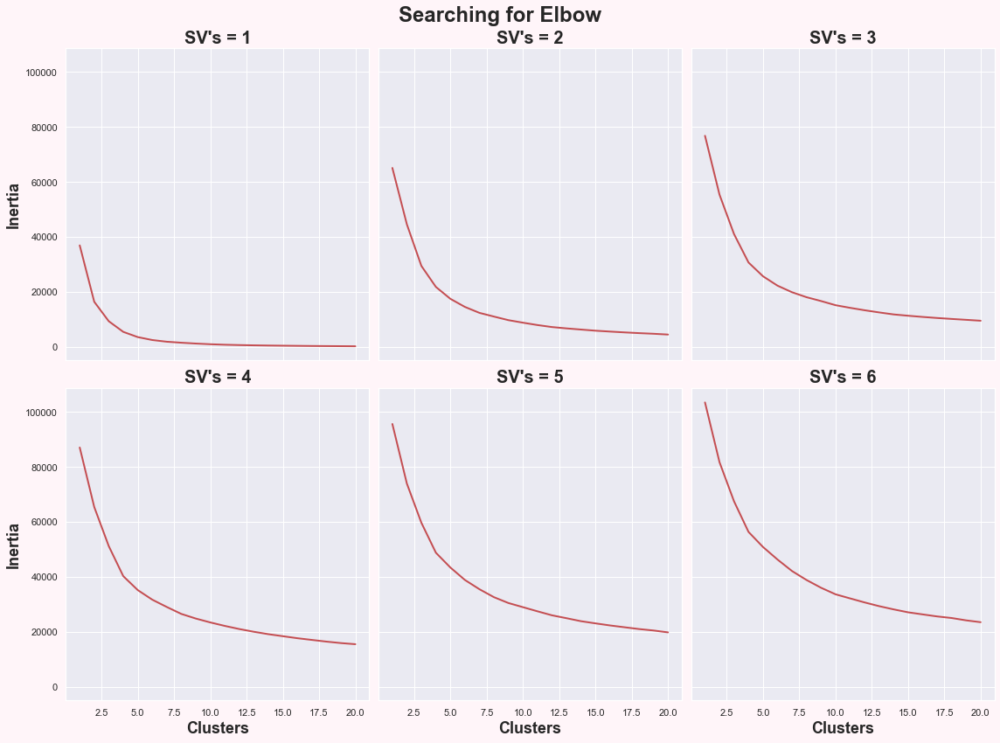

In [443]:

#Calculate PCA
# U, S, V = torch.svd_lowrank(torch.tensor(x_train))
U, S, Vh = torch.linalg.svd(torch.tensor(x_train))
V = Vh.T

#Low-dimensional Reconstruction

r = np.arange(1, 7) #Number of (reduced) dimensions to use
if len(r) % 2 != 0:  #isinstance(len(r)/2, float):
    print('Odd number of points in r.')

fig, ax = plt.subplots(2, int((r[-1]+1)/2), figsize=(16, 12), sharex=True, sharey=True)

for j, rd in enumerate(r):
    X_red = U[:, :rd] @ (torch.diag(S)[:rd, :rd]) @ Vh[:rd, :]

    clusters = []

    kmax = 21

    for i in range(1, kmax):
        km = KMeans(n_clusters=i).fit(X_red)
        clusters.append(km.inertia_)

    if j < (len(r)/2):
        i = 0
    else:
        i = 1
        j = int(j - len(r)/2)

    sns.lineplot(x=list(range(1, kmax)), y=clusters, ax=ax[i, j], linewidth=2, color='r')
    ax[i, j].set_title(f'SV\'s = {rd}', fontsize=20, fontweight='bold')
    if j == 0:
        ax[i, j].set_ylabel('Inertia', fontsize=18, fontweight='bold')
    if i == 1:
        ax[i, j].set_xlabel('Clusters', fontsize=18, fontweight='bold')

    # # Annotate arrow
    # ax[j].annotate('Possible Elbow Point', xy=(4, 87800), xytext=(4, 97800), xycoords='data',
    #              arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='blue', lw=2))
    #
    # ax[j].annotate('Possible Elbow Point', xy=(10, 60000), xytext=(10, 70000), xycoords='data',
    #              arrowprops=dict(arrowstyle='->', connectionstyle='arc3', color='blue', lw=2))

fig.suptitle('Searching for Elbow', fontsize=24, fontweight='bold')
fig.patch.set_facecolor('#FFF5F9')
# fig.patch.set_alpha(0)
fig.tight_layout()
fig.savefig('SVD_nanmean//SVDelbow.png', facecolor=fig.get_facecolor(), edgecolor='none')
plt.show()


In [ ]:
# import seaborn as sns
# rd = 3
# X_red = U[:, :rd] @ (torch.diag(S)[:rd, :rd]) @ Vh[:rd, :]
# Xdf = pd.DataFrame(X_red.numpy())
# # Let's see our data in a detailed way with pairplot
# hue = 1
# fig = sns.pairplot(Xdf, hue=hue, aspect=1, height=5)
# sns.set(rc={'figure.facecolor':'white'})
# fig.savefig(f'SVD//PairwiseClustering//pwSVD{rd}_{hue}.png', facecolor=fig.get_facecolor(), edgecolor='none')
# plt.show()

## Implement clustering using chosen number of singular vectors and clusters

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
#Calculate PCA
U, S, Vh = torch.linalg.svd(torch.tensor(x_train))
V = Vh.T
# K means clustering
# x = torch.rand(50, 2)
for rd in range(2, 6):
    for K in range(2, 11):
        # rd = 5
        X_red = U[:, :rd] @ (torch.diag(S)[:rd, :rd]) @ Vh[:rd, :]
        x = X_red.clone().detach()
        # K = 4 #Define K ahead of time
        Niter = 12 # Defne number of mean update iterations
        N, D = x.shape  # Number of samples, dimension of the ambient space

        c = x[:K, :].clone()  # Simplistic initialization for the centroids

        x_i = x.view(N, 1, D)  #torch.Tensor(x.view(N, 1, D))  # (N, 1, D) samples
        c_j = c.view(1, K, D)  #torch.Tensor(c.view(1, K, D))  # (1, K, D) centroids

        nrow = 4
        ncol = int(Niter/4)

        fig, axe = plt.subplots(nrows=nrow, ncols=ncol, figsize = (26, 18))

        for i, ax in enumerate(fig.axes):
            if i == (Niter - 1):
                handles, labels = ax.get_legend_handles_labels()
                fig.legend(handles, labels, loc='lower center', ncol=K)

            # E step: assign points to the closest cluster -------------------------
            D_ij = ((x_i - c_j) ** 2).sum(-1)  # (N, K) symbolic squared distances
            cl = D_ij.argmin(dim=1).long().view(-1)  # Points -> Nearest cluster

            # M step: update the centroids to the normalized cluster average: ------
            # Compute the sum of points per cluster:
            c.zero_()
            c.scatter_add_(0, cl[:, None].repeat(1, D), x)

            # Divide by the number of points per cluster:
            Ncl = torch.bincount(cl, minlength=K).type_as(c).view(K, 1)
            c /= Ncl  # in-place division to compute the average

            # if i%3 == 0:
            cs = sns.color_palette("tab10")  #['r', 'g', 'b', 'm', 'c', 'y',
            # 'purple', 'orange']
            for j in range(K):
              mask = cl == j
              ax.scatter(x[:, 0][mask], x[:,1][mask], color= cs[j], s=25, alpha=0.25, label=f'cluster {j+1}')  #, edgecolor='black',
              # linewidth=0.5)
              ax.set_title(f'Iteration {i+1}', fontsize=16, fontweight='bold')
              ax.scatter(c[j, 0], c[j, 1], c = cs[j], marker = 'x')

        fig.suptitle(f'K-means with SVD\nK = {K}, r = {rd}\n', fontsize=26, fontweight='bold')
        plt.legend()
        plt.tight_layout()
        fig.savefig(f'SVD//Clustering//SVD{rd}_K{K}.png', facecolor=fig.get_facecolor(), edgecolor='none')
        # plt.show()
        plt.close()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

## Let's try this again

In [445]:
r = np.arange(1, 6)  #np.arange(1, 5) #Number of (reduced) dimensions to use
Ks = np.arange(2, 11)  #np.arange(2, 6)

x_test = torch.tensor(x_test)

for i, rd in enumerate(r):
    for j, K in enumerate(Ks):

        X_proj = U[:, :rd] @ (torch.diag(S)[:rd, :rd])  # project train dat into PCA spae
        Xt_proj =  x_test @ V[:, :rd]     # project test data in PCA space

        clusters = []
        centers  = []
        preds    = []

        km = KMeans(n_clusters=K).fit(X_proj)
        clusters.append(km.inertia_)
        centers.append(km.cluster_centers_)
        preds.append(km.predict(Xt_proj))

        fig1, ax1 = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))
        fig2, ax2 = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))

        # axe1 = ax1.ravel(); axe2 = ax2.ravel()  # these were for the legend that I wasted 2 hours on
        # lst = range(K)
        for i1, n1 in enumerate(range(0, 9, 3)):
            for i2, n2 in enumerate(range(1, 10, 3)):

                ax1[i1, i2].scatter(x=x_train[:, n1], y=x_train[:, n2], c=km.labels_, linewidth=2, cmap='hsv')  #,                                    label=('{:2d}'.format(p) for p in lst))
                ax2[i1, i2].scatter(x=x_test[:, n1], y=x_test[:, n2], c=preds, linewidth=2, cmap='hsv')  #, label=\                    ('{:2d}'.format(p) for p in lst))

                # # tried for too long to get legend working. Another time
                # if i1==0 and i2==2:
                #     handles, labels = axe1[2].get_legend_handles_labels()
                #     axe1[2].legend(handles, labels, loc='upper right', ncol=K, bbox_to_anchor=(0.75, 1.2))
                #     handles, labels = axe2[2].get_legend_handles_labels()
                #     axe2[2].legend(handles, labels, loc='upper right', ncol=K, bbox_to_anchor=(0.75, 1.2))
                if i1==0 and i2==1:
                    ax1[i1, i2].set_title(f'SV\'s = {rd}', fontsize=20, fontweight='bold')
                    ax2[i1, i2].set_title(f'SV\'s = {rd}', fontsize=20, fontweight='bold')

                if i2 == 0:
                    ax1[i1, i2].set_ylabel(dfg.columns[n1], fontsize=18, fontweight='bold')
                    ax2[i1, i2].set_ylabel(dfg.columns[n1], fontsize=18, fontweight='bold')
                if i1 == 2:
                    ax1[i1, i2].set_xlabel(dfg.columns[n2], fontsize=18, fontweight='bold')
                    ax2[i1, i2].set_xlabel(dfg.columns[n2], fontsize=18, fontweight='bold')


        fig1.suptitle('Projection of Training Set with SVD', fontsize=24, fontweight='bold')
        fig1.patch.set_facecolor('#FFF5F9')
        fig1.tight_layout()
        fig1.savefig(f'SVD_nanmean//PairwiseClustering//trainSVD_r{rd}_K{K}.png', facecolor=fig.get_facecolor(),
                     edgecolor='none')
        # plt.show()
        plt.close()

        fig2.suptitle('Projection of Test Set with SVD', fontsize=24, fontweight='bold')
        fig2.patch.set_facecolor('#FFF5F9')
        fig2.tight_layout()
        fig2.savefig(f'SVD_nanmean//PairwiseClustering//testSVD_r{rd}_K{K}.png', facecolor=fig.get_facecolor(),
                     edgecolor='none')
        # plt.show()
        plt.close()

C:\Users\danny\AppData\Local\Temp/ipykernel_26912/2031711601.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_test = torch.tensor(x_test)


### Do kmeans on non-transformed data

In [16]:
for K in range(5, 6):
    # rd = 5
    # X_red = U[:, :rd] @ (torch.diag(S)[:rd, :rd]) @ Vh[:rd, :]
    x = torch.tensor(x_train).clone().detach()
    # K = 4 #Define K ahead of time
    Niter = 12 # Defne number of mean update iterations
    N, D = x.shape  # Number of samples, dimension of the ambient space

    c = x[:K, :].clone()  # Simplistic initialization for the centroids

    x_i = x.view(N, 1, D)  #torch.Tensor(x.view(N, 1, D))  # (N, 1, D) samples
    c_j = c.view(1, K, D)  #torch.Tensor(c.view(1, K, D))  # (1, K, D) centroids

    nrow = 4
    ncol = int(Niter/4)

    fig, axe = plt.subplots(nrows=nrow, ncols=ncol, figsize = (26, 18))

    for i, ax in enumerate(fig.axes):
        if i == (Niter - 1):
            handles, labels = ax.get_legend_handles_labels()
            fig.legend(handles, labels, loc='lower center', ncol=K)

        # E step: assign points to the closest cluster -------------------------
        D_ij = ((x_i - c_j) ** 2).sum(-1)  # (N, K) symbolic squared distances
        cl = D_ij.argmin(dim=1).long().view(-1)  # Points -> Nearest cluster

        # M step: update the centroids to the normalized cluster average: ------
        # Compute the sum of points per cluster:
        c.zero_()
        c.scatter_add_(0, cl[:, None].repeat(1, D), x)

        # Divide by the number of points per cluster:
        Ncl = torch.bincount(cl, minlength=K).type_as(c).view(K, 1)
        c /= Ncl  # in-place division to compute the average

        # if i%3 == 0:
        cs = sns.color_palette("tab10")  #['r', 'g', 'b', 'm', 'c', 'y',
        # 'purple', 'orange']
        for j in range(K):
          mask = cl == j
          ax.scatter(x[:, 0][mask], x[:,1][mask], color= cs[j], s=25, alpha=0.25, label=f'cluster {j+1}')  #, edgecolor='black',
          # linewidth=0.5)
          ax.set_title(f'Iteration {i+1}', fontsize=16, fontweight='bold')
          ax.scatter(c[j, 0], c[j, 1], c = cs[j], marker = 'x')

    fig.suptitle(f'K-means on Base Data\nK = {K}\n', fontsize=26, fontweight='bold')
    plt.legend()
    plt.tight_layout()
    fig.savefig(f'Plain//Clustering//plain_K{K}.png', facecolor=fig.get_facecolor(), edgecolor='none')
    # plt.show()
    plt.close()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

### Feature projection in SVD space

In [446]:
x_train, x_test, y_train, y_test = train_test_split(dfg_scaled, dfgY, test_size=0.1, random_state=42)
# x_train, x_test, y_train, y_test = train_test_split(dfg_normed, dfgY, test_size=0.1, random_state=42)
U, S, Vh = torch.linalg.svd(torch.tensor(x_train)); V = Vh.T
x_test = torch.tensor(x_test)



r = list(range(2,6))  # rd = 4
for rd in r:
    fig, ax = plt.subplots(nrows=rd, ncols=rd, figsize=(18, 12))
    for n1 in range(rd):
        for n2 in range(rd):
            ax[n1, n2].scatter(x_test[:, n1], x_test[:, n2],color='red')
            ax[n1, n2].scatter((x_test @ V[:, :rd])[:, n1], (x_test @ V[:, :rd])[:, n2], color='blue', alpha=0.15)
            ax[n1, n2].set_xlabel(f'$x_{n1}$')
            ax[n1, n2].set_ylabel(f'$x_{n2}$')

    fig.suptitle(f'Feature Projection of Test Set onto First {rd} Singular Vectors', fontsize=24, fontweight='bold')
    # fig.savefig(f'SVD//Projection//TestSetSVD_r{rd}_x{n1}x{n2}_Centered.png', facecolor=fig.get_facecolor(),
    fig.savefig(f'SVD_nanmean//Projection//TestSetSVD_r{rd}_x{n1}x{n2}_nonCenter.png', facecolor=fig
                .get_facecolor(), edgecolor='none')
    # plt.show()
    plt.close()

In [385]:
(x_test @ V[:, :rd]).shape

torch.Size([895, 1])

### Make Confusion Matrix for SVD

In [447]:
# #Calculate PCA
# U, S, V = torch.pca_lowrank(torch.tensor(x_train), center=False)


r = np.arange(1, 6)  #np.arange(1, 5) #Number of (reduced) dimensions to use
Ks = np.arange(2, 11)  #(2, 6)  #np.arange(2, 6)

for i, rd in enumerate(r):
    for j, K in enumerate(Ks):


        X_proj = U[:, :rd] @ (torch.diag(S)[:rd, :rd])  # project train dat into PCA spae
        Xt_proj =  x_test @ V[:, :rd]     # project test data in PCA space

        clusters = []
        centers  = []

        kmt = KMeans(n_clusters=K).fit(x_test)
        kmt = kmt.predict(x_test)  # compute "truth"
        km = KMeans(n_clusters=K).fit(X_proj)
        clusters.append(km.inertia_)
        centers.append(km.cluster_centers_)
        preds = km.predict(Xt_proj)

        cfmat = confusion_matrix(kmt, preds)

        fig = plt.figure(figsize=(16, 16))
        sns.heatmap(cfmat/np.sum(cfmat), annot=True, fmt='.2%', cmap='coolwarm', linecolor='k', linewidth=0.5)
        plt.title(f'Confusion Matrix for Kmeans + SVD of Credit Card Test Data\nK = {K}, r = {rd}', fontsize=24,
                  fontweight='bold')
        plt.xlabel('SVD Prediction', fontsize=18, fontweight='bold')
        plt.ylabel('Base Data', fontsize=18, fontweight='bold')
        fig.savefig(f'SVD_nanmean//ConfusionMatrix//CMatSVD_r{rd}_K{K}.png', facecolor=fig.get_facecolor(),
                    edgecolor='none')
        # plt.show()
        plt.close()

### Kmeans clustering on non-transformed data

In [452]:
# K means clustering
for K in range(2, 11):
    x = torch.tensor(x_train)  #x_train.clone().detach()
    Niter = 12 # Defne number of mean update iterations
    N, D = x.shape  # Number of samples, dimension of the ambient space

    c = x[:K, :].clone()  # Simplistic initialization for the centroids

    x_i = x.view(N, 1, D)  #torch.Tensor(x.view(N, 1, D))  # (N, 1, D) samples
    c_j = c.view(1, K, D)  #torch.Tensor(c.view(1, K, D))  # (1, K, D) centroids

    nrow = 4
    ncol = int(Niter/4)

    fig, axe = plt.subplots(nrows=nrow, ncols=ncol, figsize = (26, 18))

    for i, ax in enumerate(fig.axes):
        if i == (Niter - 1):
            handles, labels = ax.get_legend_handles_labels()
            fig.legend(handles, labels, loc='lower center', ncol=K)

        # E step: assign points to the closest cluster -------------------------
        D_ij = ((x_i - c_j) ** 2).sum(-1)  # (N, K) symbolic squared distances
        cl = D_ij.argmin(dim=1).long().view(-1)  # Points -> Nearest cluster

        # M step: update the centroids to the normalized cluster average: ------
        # Compute the sum of points per cluster:
        c.zero_()
        c.scatter_add_(0, cl[:, None].repeat(1, D), x)

        # Divide by the number of points per cluster:
        Ncl = torch.bincount(cl, minlength=K).type_as(c).view(K, 1)
        c /= Ncl  # in-place division to compute the average

        # if i%3 == 0:
        cs = sns.color_palette("tab10")  #['r', 'g', 'b', 'm', 'c', 'y',
        # 'purple', 'orange']
        for j in range(K):
          mask = cl == j
          ax.scatter(x[:, 0][mask], x[:,1][mask], color= cs[j], s=25, alpha=0.25, label=f'cluster {j+1}')  #, edgecolor='black',
          # linewidth=0.5)
          ax.set_title(f'Iteration {i+1}', fontsize=16, fontweight='bold')
          ax.scatter(c[j, 0], c[j, 1], c = cs[j], marker = 'x')

    fig.suptitle(f'K-means with No Transform\nK = {K}\n', fontsize=26, fontweight='bold')
    plt.legend()
    plt.tight_layout()
    fig.savefig(f'Clustering//Basic_K{K}_x{n1}x{n2}.png', facecolor=fig.get_facecolor(), edgecolor='none')
    # plt.show()
    plt.close()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

In [453]:
Ks = np.arange(2, 11)  #np.arange(2, 6)

x_test = torch.tensor(x_test)

# for i, rd in enumerate(r):
for j, K in enumerate(Ks):

    # X_proj = U[:, :rd] @ (torch.diag(S)[:rd, :rd])  # project train dat into PCA spae
    # Xt_proj =  x_test @ V[:, :rd]     # project test data in PCA space

    clusters = []
    centers  = []
    preds    = []

    km = KMeans(n_clusters=K).fit(x_train)
    clusters.append(km.inertia_)
    centers.append(km.cluster_centers_)
    preds.append(km.predict(x_test))

    # fig1, ax1 = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))
    fig2, ax2 = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))

    # axe1 = ax1.ravel(); axe2 = ax2.ravel()  # these were for the legend that I wasted 2 hours on
    # lst = range(K)
    for i1, n1 in enumerate(range(0, 9, 3)):
        for i2, n2 in enumerate(range(1, 10, 3)):

            # ax1[i1, i2].scatter(x=x_train[:, n1], y=x_train[:, n2], c=km.labels_, linewidth=2, cmap='hsv')  #,                                    label=('{:2d}'.format(p) for p in lst))
            ax2[i1, i2].scatter(x=x_test[:, n1], y=x_test[:, n2], c=preds, linewidth=2, cmap='hsv')  #, label=\                    ('{:2d}'.format(p) for p in lst))

            # # tried for too long to get legend working. Another time
            # if i1==0 and i2==2:
            #     handles, labels = axe1[2].get_legend_handles_labels()
            #     axe1[2].legend(handles, labels, loc='upper right', ncol=K, bbox_to_anchor=(0.75, 1.2))
            #     handles, labels = axe2[2].get_legend_handles_labels()
            #     axe2[2].legend(handles, labels, loc='upper right', ncol=K, bbox_to_anchor=(0.75, 1.2))
            if i1==0 and i2==1:
                # ax1[i1, i2].set_title(f'SV\'s = {rd}', fontsize=20, fontweight='bold')
                ax2[i1, i2].set_title(f'Cluster\'s = {K}', fontsize=20, fontweight='bold')

            if i2 == 0:
                # ax1[i1, i2].set_ylabel(dfg.columns[n1], fontsize=18, fontweight='bold')
                ax2[i1, i2].set_ylabel(dfg.columns[n1], fontsize=18, fontweight='bold')
            if i1 == 2:
                # ax1[i1, i2].set_xlabel(dfg.columns[n2], fontsize=18, fontweight='bold')
                ax2[i1, i2].set_xlabel(dfg.columns[n2], fontsize=18, fontweight='bold')


    # fig1.suptitle('Projection of Training Set with SVD', fontsize=24, fontweight='bold')
    # fig1.patch.set_facecolor('#FFF5F9')
    # fig1.tight_layout()
    # fig1.savefig(f'SVD_nanmean//PairwiseClustering//trainSVD_r{rd}_K{K}.png', facecolor=fig.get_facecolor(),
    #              edgecolor='none')
    # # plt.show()
    # plt.close()

    fig2.suptitle('Kmeans Clustering of Test Set with No Transform', fontsize=24, fontweight='bold')
    fig2.patch.set_facecolor('#FFF5F9')
    fig2.tight_layout()
    fig2.savefig(f'Clustering//testBasic_K{K}.png', facecolor=fig.get_facecolor(),
                 edgecolor='none')
    # plt.show()
    plt.close()

C:\Users\danny\AppData\Local\Temp/ipykernel_26912/2953217201.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x_test = torch.tensor(x_test)


### Investigate Data

In [ ]:
# BestCols = ['BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CASH_ADVANCE_TRX',
#             'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS']
BestCols = ['BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CASH_ADVANCE_TRX',
            'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS']


sns.pairplot(dfg[], hue='BALANCE', aspect=1, height=5)
sns.set(rc={'figure.facecolor':'white'})
plt.show()